<h1 style="text-align:center; font-size:45px"> Titanic Machine Learning | EDA</h1>

# About the dataset

- We are going to work with titanic dataSet, it is a very famous dataSet, for Machine Learning classification Problem. Where we, predict the classification for survival or deceased of passengers of Titanic.
- Source: https://www.kaggle.com/competitions/titanic

# Table of Contents

<a href='#Importing-necessary-libraries-&-setting-Notebook-defaults'><h3>1. Importing necessary libraries and setting Notebook defaults</h3></a>
<a href='#Reading-the-dataset'><h3>2. Reading the dataset</h3></a>
<a href='#Assumtions-based-on-data-analysis'><h3>3. Assumtions based on data analysis</h3></a>
<a href='#Data-Cleaning'><h3>4. Data Cleaning</h3></a>
<a href='#Exploratory-Data-Analysis'><h3>5. Exploratory Data Analysis</h3></a>
<a href='#Feature-Engineering'><h3>6. Feature Engineering</h3></a>
<a href='#Machine-Learning'><h3>7. Machine Learning</h3></a>
<a href='#Final-Model'><h3>8. Final Model</h3></a>

# Importing necessary libraries & setting Notebook defaults

In [1]:
# Data Analyzing Libraries:
import numpy as np
import pandas as pd

In [2]:
# Data Visualization Libraries:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
# Setting DPI for Figure Level Plots
plt.rcParams["figure.dpi"] = 720

In [4]:
sns.set_style('whitegrid')

# Reading the dataset

In [5]:
titanic_train = pd.read_csv('titanic_train.csv')
titanic_test = pd.read_csv('titanic_test.csv')
combine = [titanic_train, titanic_test]
titanic_train

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [6]:
print("Number of rows: " + str(titanic_train.shape[0]) + "\nNumber of columns: " + str(titanic_train.shape[1]))

Number of rows: 891
Number of columns: 12


*We have record of 891 Passengers in training dataset*

### Datasets Information

In [7]:
print('Training Dataset Info:')
titanic_train.info()
print('-'*50)
print('Testing Data Set Info:')
titanic_test.info()

Training Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB
--------------------------------------------------
Testing Data Set Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  


In [8]:
titanic_train['PassengerId'].nunique()
# No Duplicates in 'PassengerId'

891

### Checking for Null values

In [9]:
print('Nulls in Training Dataset:')
print(titanic_train.isnull().sum())
print('-'*50)
print('Nulls in Testing Dataset:')
print(titanic_test.isnull().sum())

Nulls in Training Dataset:
PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64
--------------------------------------------------
Nulls in Testing Dataset:
PassengerId      0
Pclass           0
Name             0
Sex              0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64


### Correlation between Numeric Columns

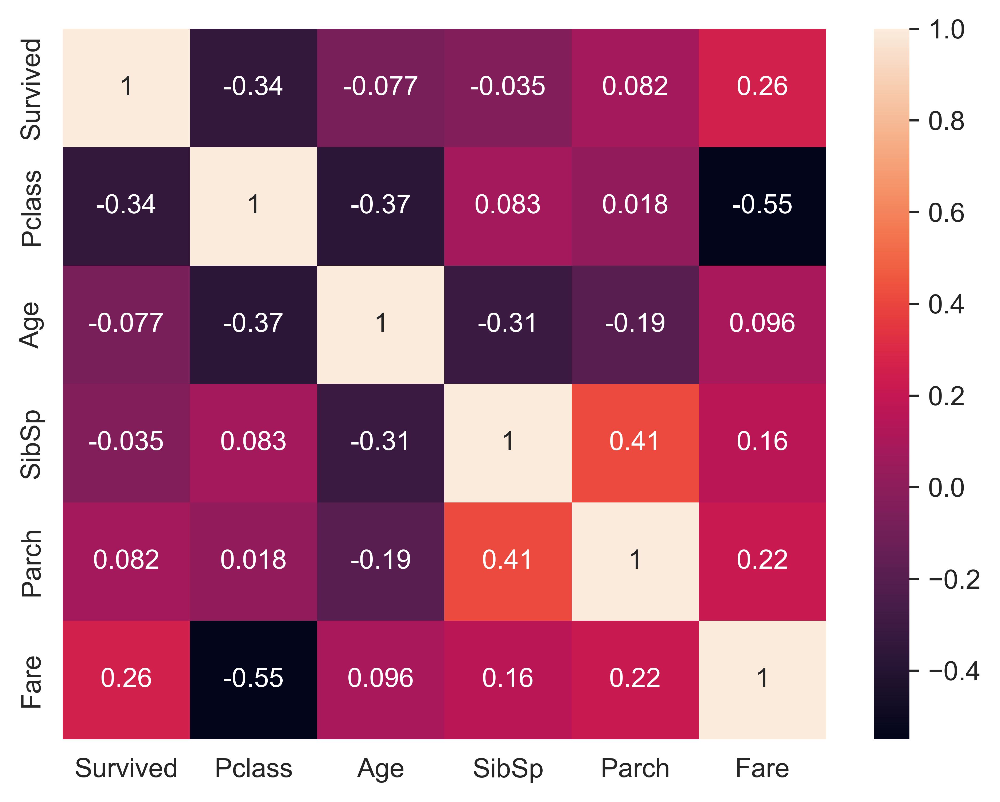

In [10]:
sns.heatmap(titanic_train.drop('PassengerId', axis=1).corr(), annot=True)
plt.show()

### Categorical Column Discription

In [11]:
titanic_train.describe(include=['O'])

,Name,Sex,Ticket,Cabin,Embarked
count,891,891,891,204,889
unique,891,2,681,147,3
top,"Braund, Mr. Owen Harris",male,347082,B96 B98,S
freq,1,577,7,4,644


### Checking Classs Imblance

In [12]:
titanic_train['Survived'].value_counts()

0    549
1    342
Name: Survived, dtype: int64

# Assumtions based on data analysis
We arrive at following assumptions based on data analysis done so far. We may validate these assumptions further before taking appropriate actions.

### Features that maybe not useful
- 'Name' column is relatively non-standard, may not contribute directly to survival but if Title's from 'Name' is extracted then there may be a high correlation between 'Title' and 'Survival' features. Then, there may be not much requirement of 'Name' feature, so maybe dropped.
- 'PassengerId' may be dropped from training dataset as it does not contribute to survival.
- 'Ticket' column may be dropped because, it contains 23.56% Duplicate Values which is very high and there may not be a correlation between 'Ticket' and 'Survival'.
- 'Cabin' column may be dropped as it is highly incomplete or contains many null values in dataset.

### Features that can be filled
- 'Age' column contains 19.86% Null Values but still, It is very much correlated to other columns in the dataset.
- 'Embarked' column as it may correlate with survival and only have two Null Values.

### Features that can transform
- We may want to create a new feature called 'IsAlone' based on 'Parch' and 'SibSp' values. If value of 'Parch' and 'SibSp' is zero, hence Passenger is alone on the ship.
- We may want to engineer the Name feature to extract Title as a new feature. Then, we change 'Title' to Numerical Ordinal Feature.
- 'Sex' and 'Embarked' are Non-Numerical Categorical Columns and we need to convert them to Numerical Ordinal Features.

# Data Cleaning

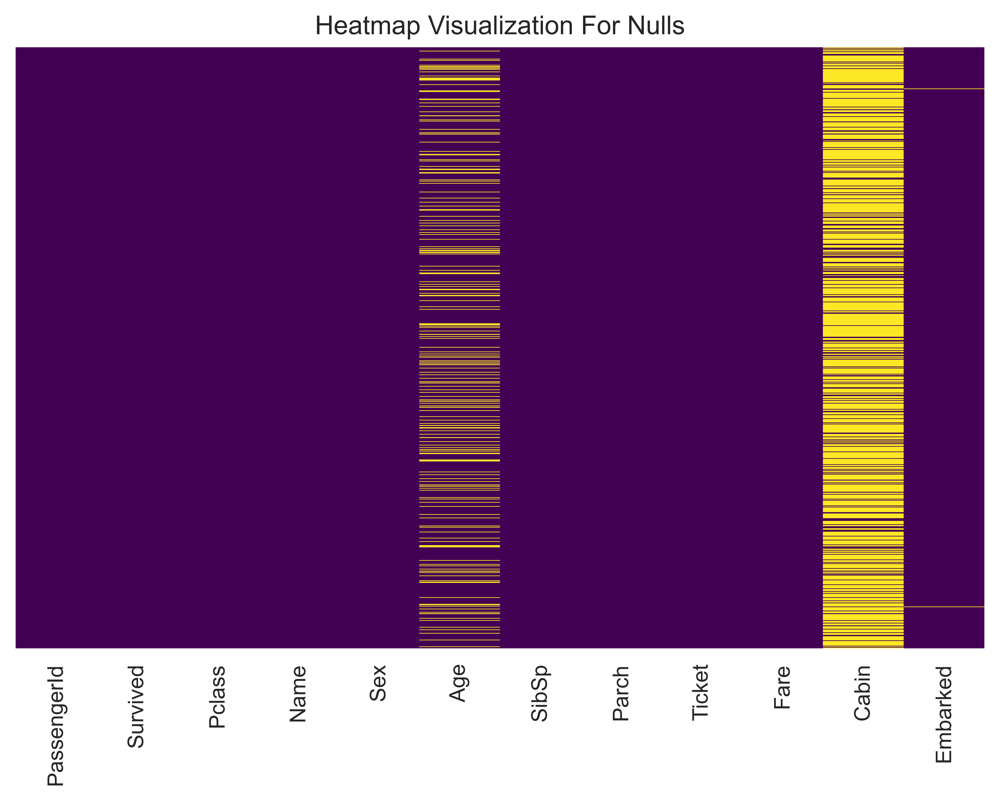

In [13]:
plt.figure(figsize=(8,5))
plt.title('Heatmap Visualization For Nulls')
sns.heatmap(titanic_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')
plt.show()

### Droping 'Cabin' Column

In [14]:
for dataset in combine:
    dataset.drop('Cabin', axis=1, inplace=True)

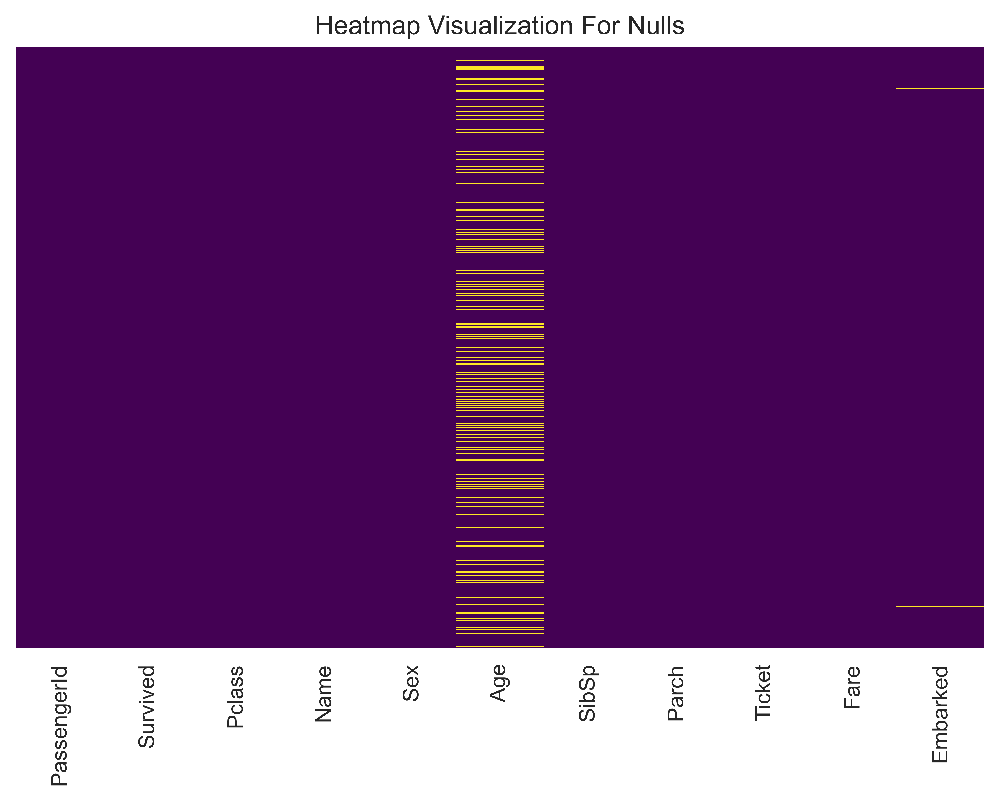

In [15]:
plt.figure(figsize=(8,5))
plt.title('Heatmap Visualization For Nulls')
sns.heatmap(titanic_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')
plt.show()

### Dealing Nulls in 'Age' Column

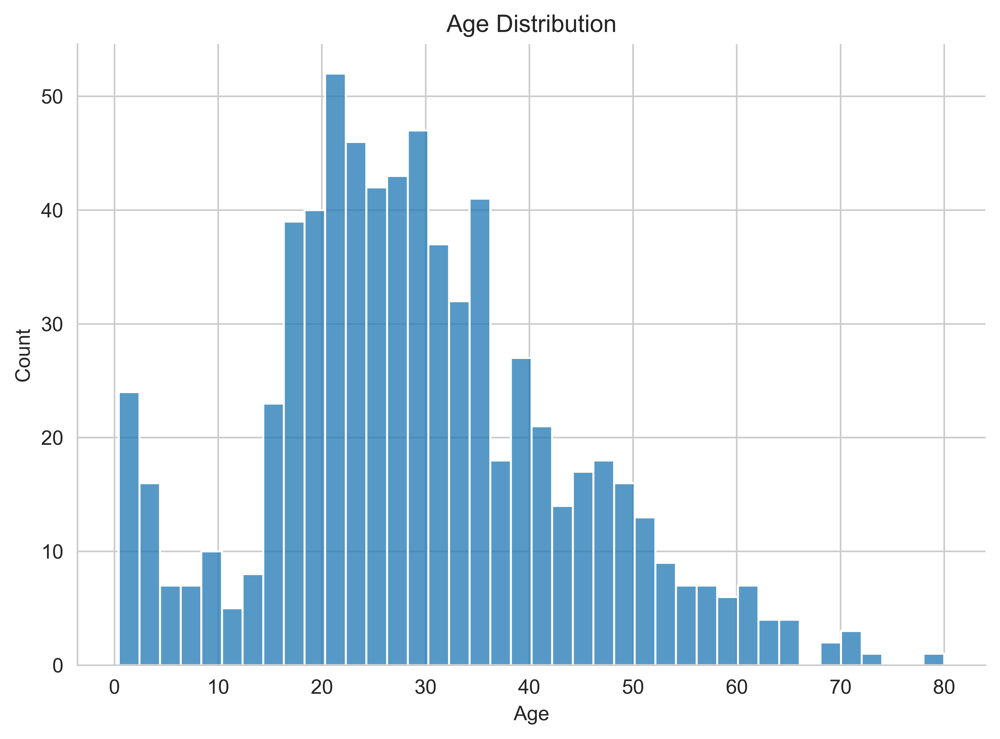

In [16]:
sns.displot(titanic_train['Age'].dropna(), bins=40, aspect=1.4)
plt.title("Age Distribution")
plt.show()

**Note:**
- 'Age' column is not normally distributed hence, It is not good to fill Nulls by one Median Age Value of whole Column. So, rather choosing one median value we choose median age value based on the 'Pclass' and 'Age'. 'Age' may also relate to 'Sex'.

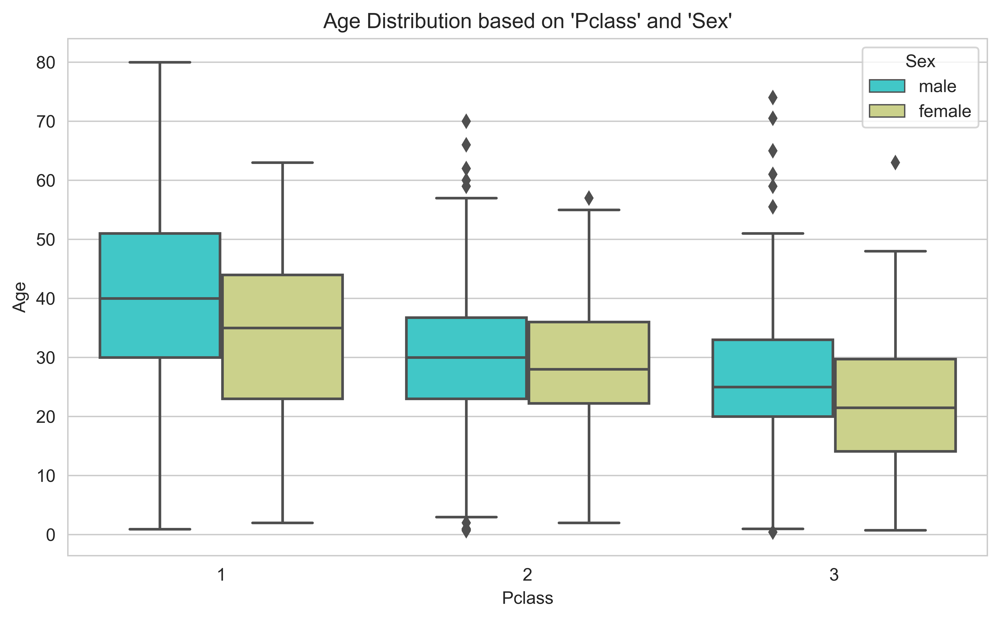

In [17]:
plt.figure(figsize=(8,5))
plt.title("Age Distribution based on 'Pclass' and 'Sex'")
sns.boxplot(x='Pclass',y='Age', hue='Sex', data=titanic_train, palette='rainbow')
plt.tight_layout()
plt.show()

**Observations:**
- The age distribution of passengers have clearly visible outliers with respect to their 'Pclass'.
- Higher 'Pclass' passengers are older.
- Males have higher central value of Age than Females.

In [18]:
# Median Age of Passengers based on their 'Pclass' and 'Sex'
print("Median age of Male Passengers in First Class: " + 
      str(titanic_train[(titanic_train['Pclass'] == 1) & (titanic_train['Sex'] == 'male')]['Age'].median()))
print("Median age of Female Passengers in First Class: " + 
      str(titanic_train[(titanic_train['Pclass'] == 1) & (titanic_train['Sex'] == 'female')]['Age'].median()))
print("Median age of Male Passengers in Second Class: " + 
      str(titanic_train[(titanic_train['Pclass'] == 2) & (titanic_train['Sex'] == 'male')]['Age'].median()))
print("Median age of Female Passengers in Second Class: " + 
      str(titanic_train[(titanic_train['Pclass'] == 2) & (titanic_train['Sex'] == 'female')]['Age'].median()))
print("Median age of Male Passengers in Third Class: " + 
      str(titanic_train[(titanic_train['Pclass'] == 3) & (titanic_train['Sex'] == 'male')]['Age'].median()))
print("Median age of Female Passengers in Third Class: " + 
      str(titanic_train[(titanic_train['Pclass'] == 3) & (titanic_train['Sex'] == 'female')]['Age'].median()))

Median age of Male Passengers in First Class: 40.0
Median age of Female Passengers in First Class: 35.0
Median age of Male Passengers in Second Class: 30.0
Median age of Female Passengers in Second Class: 28.0
Median age of Male Passengers in Third Class: 25.0
Median age of Female Passengers in Third Class: 21.5


In [19]:
# Let's create an Median Imputation Function 
def impute_age(cols):
    Age = cols[0]
    Pclass = cols[1]
    Sex = cols[2]
    if pd.isnull(Age):
        if Pclass == 1 and Sex == 'male':
            return int(titanic_train['Age'][(titanic_train['Pclass'] == 1) & (titanic_train['Sex'] == 'male')].median())
        elif Pclass == 1 and Sex == 'female':
            return int(titanic_train['Age'][(titanic_train['Pclass'] == 1) & (titanic_train['Sex'] == 'female')].median())
        elif Pclass == 2 and Sex == 'male':
            return int(titanic_train['Age'][(titanic_train['Pclass'] == 2) & (titanic_train['Sex'] == 'male')].median())
        elif Pclass == 2 and Sex == 'female':
            return int(titanic_train['Age'][(titanic_train['Pclass'] == 2) & (titanic_train['Sex'] == 'female')].median())
        elif Pclass == 3 and Sex == 'male':
            return int(titanic_train['Age'][(titanic_train['Pclass'] == 3) & (titanic_train['Sex'] == 'male')].median())
        elif Pclass == 3 and Sex == 'female':
            return int(titanic_train['Age'][(titanic_train['Pclass'] == 3) & (titanic_train['Sex'] == 'female')].median())
    else:
        return Age    # If there is Actual 'Age' is present

In [20]:
for dataset in combine:
    dataset['Age'] = dataset[['Age', 'Pclass', 'Sex']].apply(impute_age, axis=1)

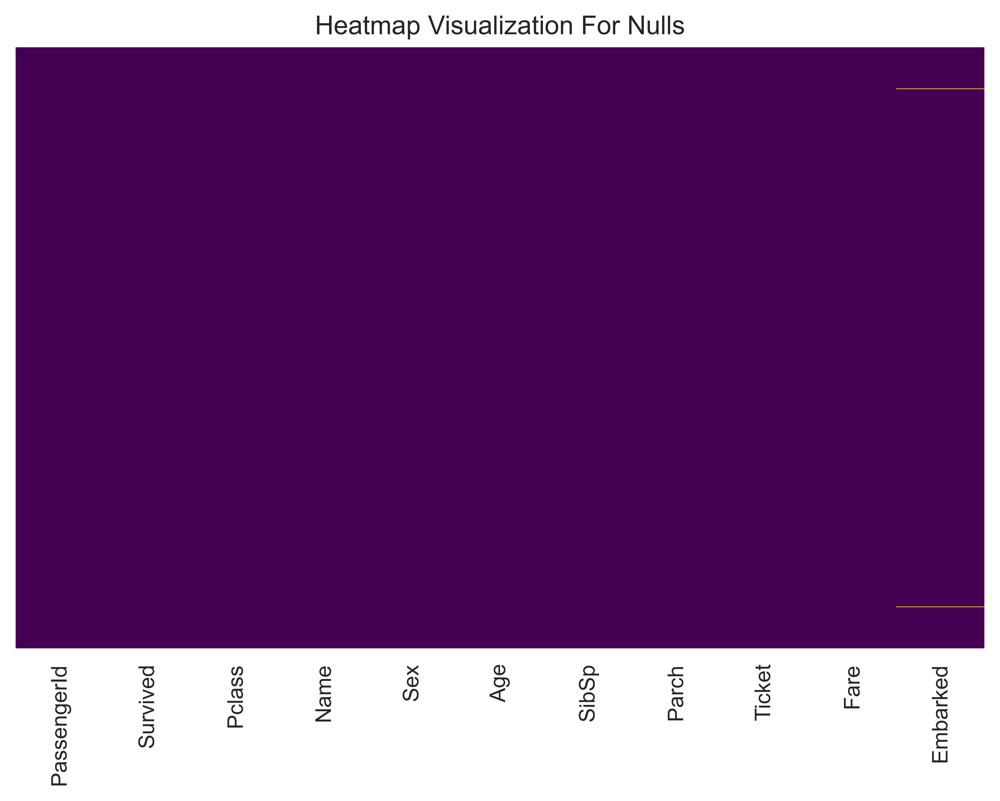

In [21]:
# Again Checking 'Age' Column
plt.figure(figsize=(8,5))
plt.title('Heatmap Visualization For Nulls')
sns.heatmap(titanic_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')
plt.show()

### Dealing Nulls in 'Embarked' Column

In [22]:
titanic_train[titanic_train['Embarked'].isnull()]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
61,62,1,1,"Icard, Miss. Amelie",female,38.0,0,0,113572,80.0,NaN
829,830,1,1,"Stone, Mrs. George Nelson (Martha Evelyn)",female,62.0,0,0,113572,80.0,NaN


- *'Embarked' Column have only two Nulls, therefore we fill them by mode.*

In [23]:
# Port from which most passengers are embarked
freq_port = titanic_train['Embarked'].dropna().mode()[0]
freq_port

'S'

In [24]:
for dataset in combine:
    dataset['Embarked'].fillna(freq_port, inplace=True)

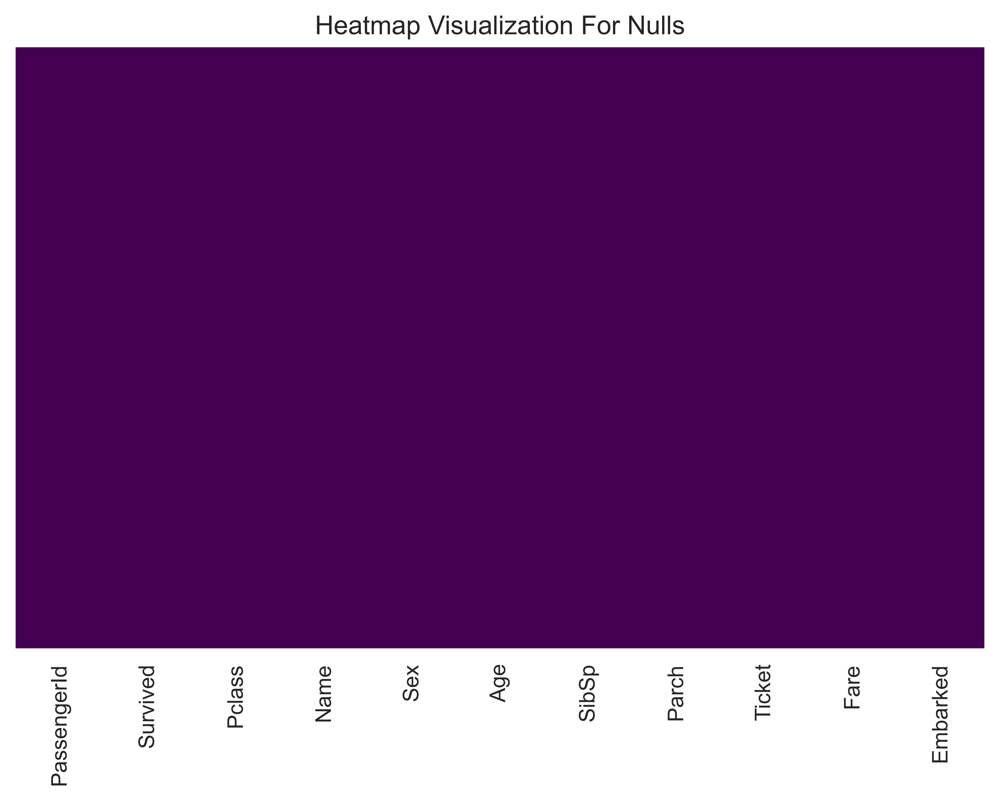

In [25]:
plt.figure(figsize=(8,5))
plt.title('Heatmap Visualization For Nulls')
sns.heatmap(titanic_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')
plt.show()
# Cleaned

### A Null in Test Dataset 'Fare' Feature

In [26]:
titanic_test[titanic_test['Fare'].isnull()]

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
152,1044,3,"Storey, Mr. Thomas",male,60.5,0,0,3701,NaN,S


In [27]:
titanic_test.loc[(titanic_test['Fare'].isnull()) & (titanic_test['Pclass'] == 3), 'Fare'] = \
titanic_train[titanic_train['Pclass'] == 3]['Fare'].median()

In [28]:
titanic_test.isnull().sum()
# No Nulls in Test Dataset

PassengerId    0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Embarked       0
dtype: int64

# Exploratory Data Analysis

### Count of Survived and Not Survived Passengers

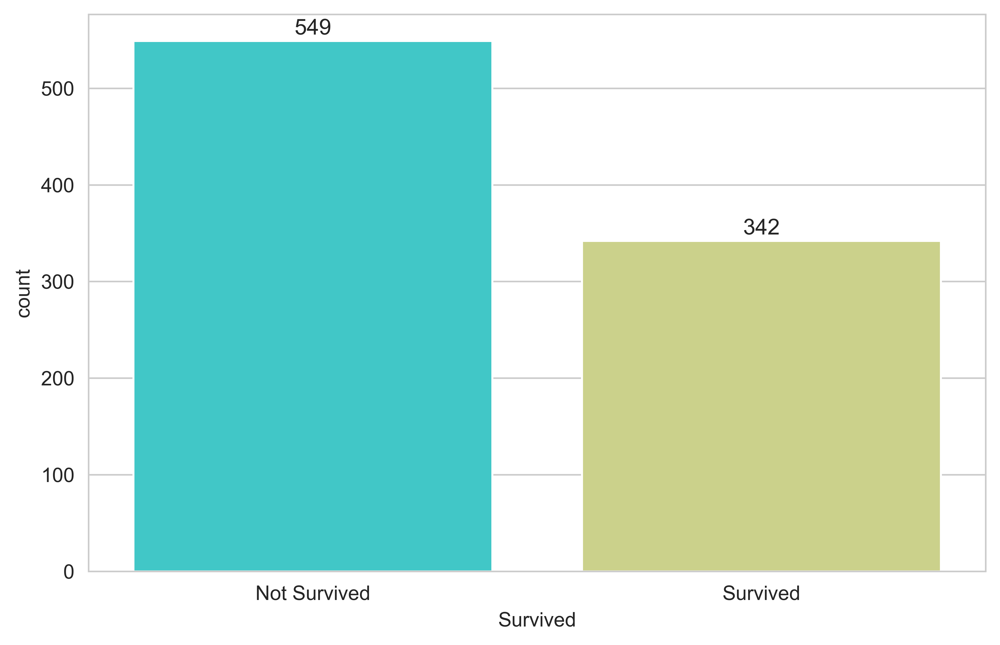

In [29]:
plt.figure(figsize=(8,5))
c1 = sns.countplot(x='Survived', data=titanic_train, palette='rainbow')
c1.bar_label(c1.containers[0], padding=1, size=11)
plt.xticks(ticks=[0,1] ,labels=['Not Survived', 'Survived'])
plt.show()

In [30]:
# Count
survival_count = (titanic_train.groupby('Survived')['PassengerId'].count().to_frame()
                  .rename(columns = {'PassengerId' : 'Count'}))
survival_count.index = survival_count.index.map({0: 'Not Survived', 1: 'Survived'})
survival_count

,Count
Survived,
Not Survived,549
Survived,342


### Survival based on Gender

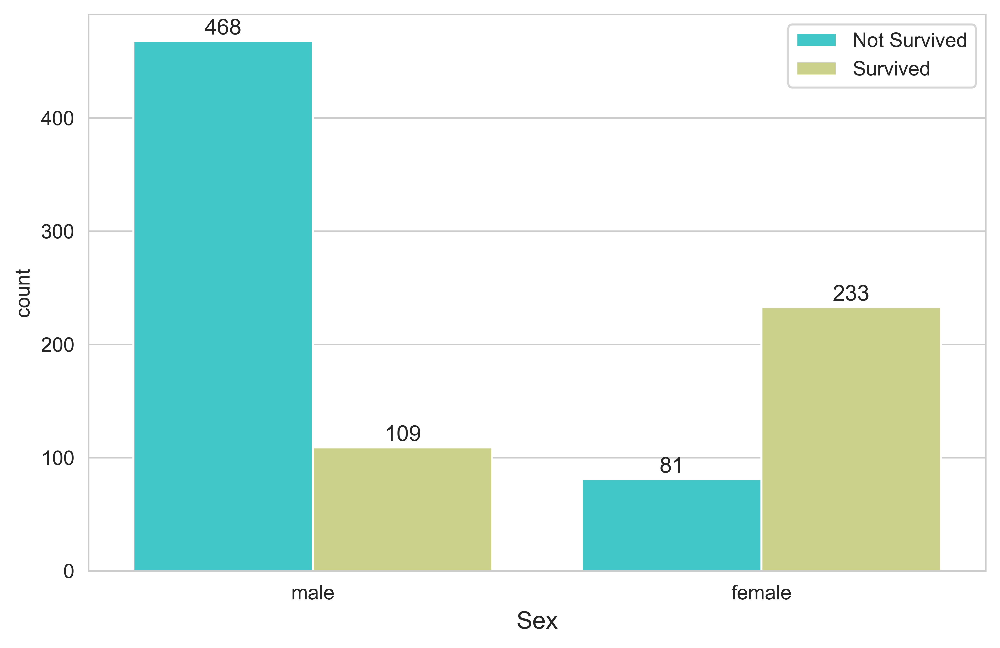

In [31]:
plt.figure(figsize=(8,5))
c1 = sns.countplot(x='Sex', hue='Survived', data=titanic_train,  palette='rainbow')
c1.bar_label(c1.containers[0], padding=1, size=11)
c1.bar_label(c1.containers[1], padding=1, size=11)
plt.legend(labels=['Not Survived', 'Survived'])
plt.xlabel('Sex', fontsize=12)
plt.show()

In [32]:
# Count
sex_survival_count = (titanic_train.groupby(['Sex', 'Survived'])['PassengerId'].count().unstack(fill_value=0).rename_axis(None, axis=1))
sex_survival_count.rename(columns={0: 'Not Survived', 1: 'Survived'}, inplace=True)
sex_survival_count['Total'] = sex_survival_count.sum(axis=1)
sex_survival_count

,Not Survived,Survived,Total
Sex,,,
female,81,233,314
male,468,109,577


In [33]:
print("Number of times Males boarded than Females: " + 
      str(titanic_train['Sex'].value_counts().loc['male'] / titanic_train['Sex'].value_counts().loc['female']))

Number of times Males boarded than Females: 1.8375796178343948


In [34]:
# Survival rate
titanic_train[['Sex', 'Survived']].groupby('Sex').mean().sort_values(by='Survived', ascending=False)

,Survived
Sex,
female,0.742038
male,0.188908


**Observation:**
- Females got more chance to live rather than Males, even taking into account that there were more Males on the Ship than Females.

### Survival based on Pclass (Passenger Class)

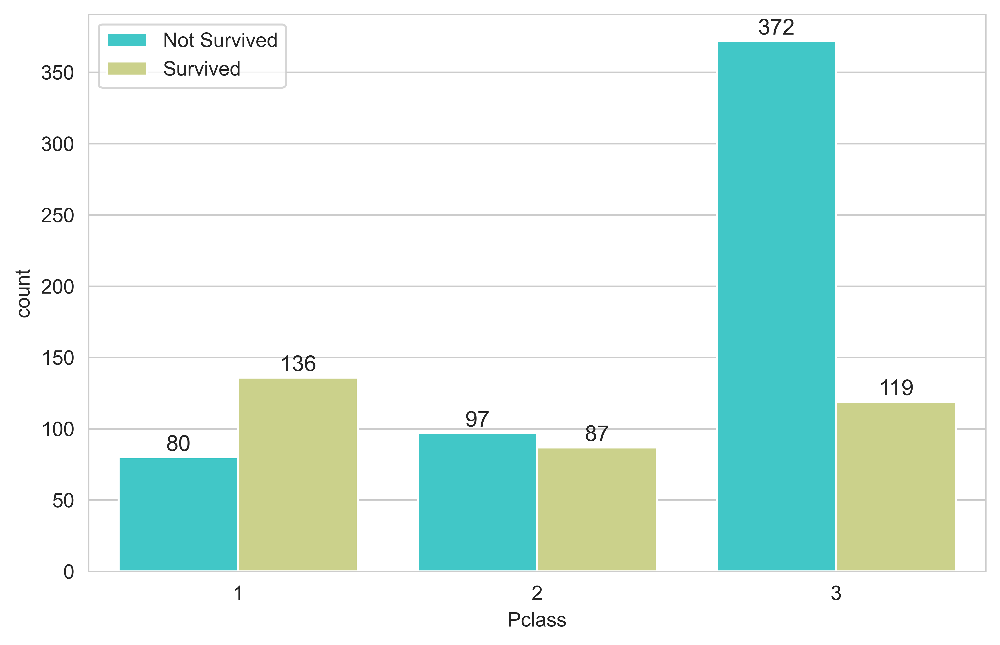

In [35]:
plt.figure(figsize=(8,5))
c1 = sns.countplot(data=titanic_train, x='Pclass', hue='Survived', palette='rainbow')
c1.bar_label(c1.containers[0], padding=1, size=11)
c1.bar_label(c1.containers[1], padding=1, size=11)
plt.legend(labels=['Not Survived', 'Survived'])
plt.show()

In [36]:
# Count
pclass_survival_count = (titanic_train.groupby(['Pclass', 'Survived'])['PassengerId'].count()
                        .unstack(fill_value=0).rename_axis(None, axis=1))
pclass_survival_count.rename(columns={0: 'Not Survived', 1: 'Survived'}, inplace=True)
pclass_survival_count['Total'] = pclass_survival_count.sum(axis=1)
pclass_survival_count

,Not Survived,Survived,Total
Pclass,,,
1,80,136,216
2,97,87,184
3,372,119,491


In [37]:
# Survival Rate
titanic_train[['Pclass', 'Survived']].groupby('Pclass').mean().sort_values(by='Survived', ascending=False)

,Survived
Pclass,
1,0.629630
2,0.472826
3,0.242363


**Observation:**
- Higher 'Pclass' increase chance of being survived.

### Survival based on 'Pclass' and 'Sex'

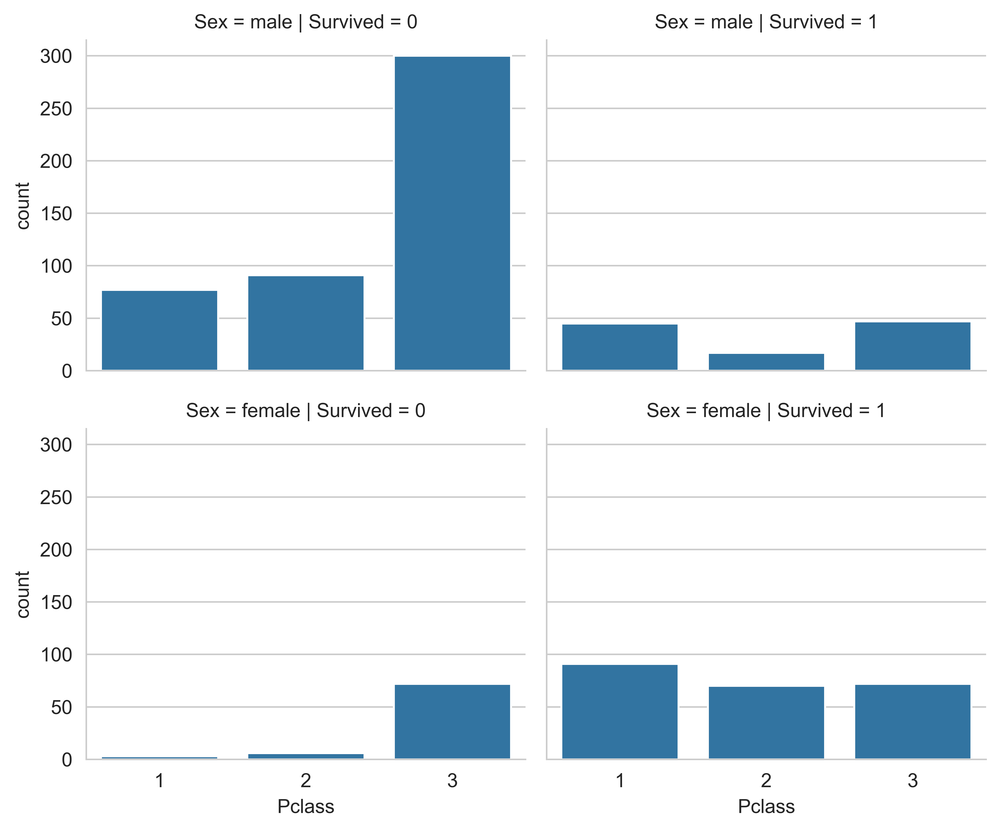

In [38]:
grid = sns.FacetGrid(data=titanic_train, col='Survived', row='Sex', height=3, aspect=1.2)
grid.map(sns.countplot, 'Pclass', order=[1,2,3])
plt.show()

**Observations:**
- Females got more chance to live with respect to Males anyway.
- Females have good survival rate except females in Passenger Class 3.
- The higest count of Male passengers not survived belongs to Passenger Class 3.

### Survival based on Embarkment

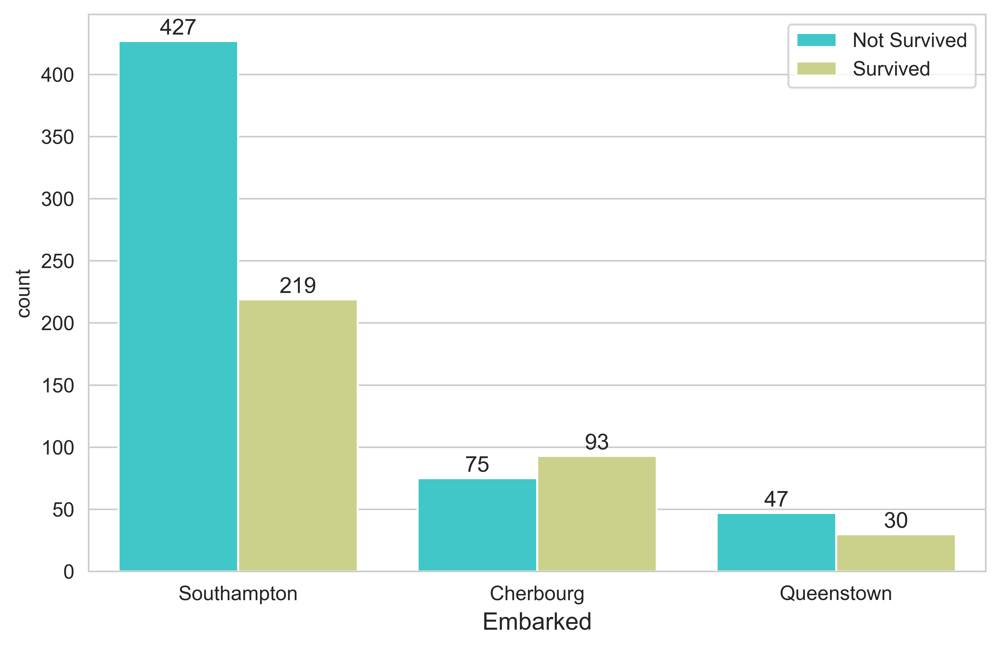

In [39]:
plt.figure(figsize=(8,5))
c1 = sns.countplot(x='Embarked', hue='Survived', data=titanic_train, palette='rainbow')
c1.bar_label(c1.containers[0], padding=1, size=11)
c1.bar_label(c1.containers[1], padding=1, size=11)
plt.legend(labels=['Not Survived', 'Survived'])
plt.xticks(ticks=[0,1,2], labels=['Southampton', 'Cherbourg', 'Queenstown'])
plt.xlabel('Embarked', fontsize=12)
plt.show()

In [40]:
# Count
embark_survival_count = (titanic_train.groupby(['Embarked', 'Survived'])['PassengerId'].count()
                        .unstack(fill_value=0).rename_axis(None, axis=1))
embark_survival_count.rename(columns={0: 'Not Survived', 1: 'Survived'}, inplace=True)
embark_survival_count['Total'] = embark_survival_count.sum(axis=1)
embark_survival_count

,Not Survived,Survived,Total
Embarked,,,
C,75,93,168
Q,47,30,77
S,427,219,646


In [41]:
# Survival Rate
embark_name = {'C':'Cherbourg', 'Q':'Queenstown', 'S':'Southampton'}
embark_survival = titanic_train[['Embarked', 'Survived']].groupby('Embarked').mean().sort_values(by='Survived', ascending=False)
embark_survival.index = embark_survival.index.map(embark_name)
embark_survival

,Survived
Embarked,
Cherbourg,0.553571
Queenstown,0.389610
Southampton,0.339009


### Survival based on 'Embarked' and 'Sex'

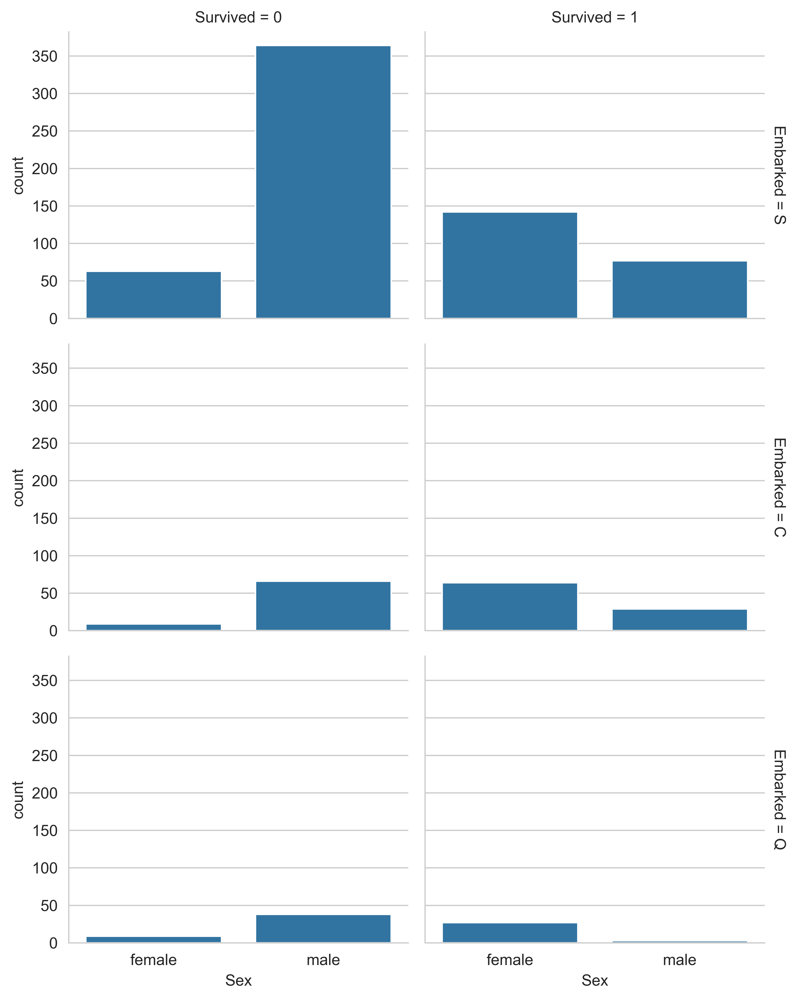

In [42]:
grid = sns.FacetGrid(data=titanic_train, col='Survived', row='Embarked', palette='rainbow', aspect=1.2, margin_titles=True)
grid.map(sns.countplot, 'Sex', order=['female', 'male'])
plt.show()

**Observations:**
- The Passengers who embarked from Cherbourg have highest survival rate.
- All ports have higher Female Passengers Survived Count than Not Survived Count.
- The highest count of Male passengers who did not survived were embarked from Southampton.

### 'Fare', 'Embarked' and 'Sex'

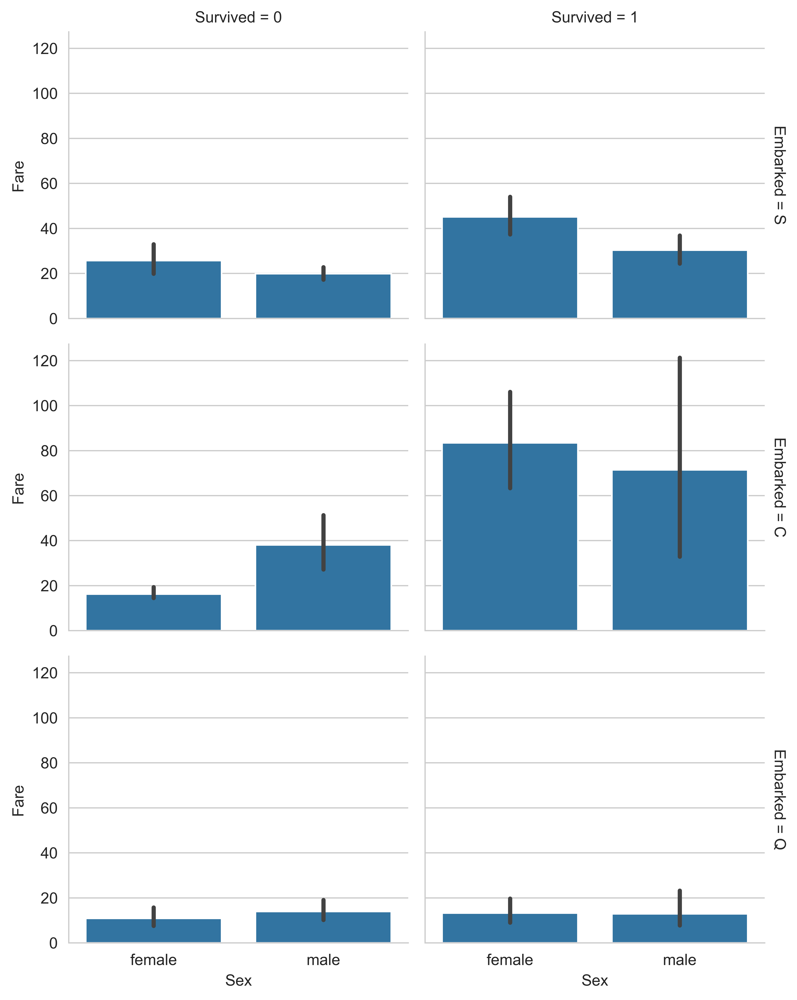

In [43]:
grid = sns.FacetGrid(titanic_train, row='Embarked', col='Survived', height=3, aspect=1.2, margin_titles=True)
grid.map(sns.barplot, 'Sex', 'Fare', order=['female', 'male'])
plt.show()

**Observations:**
- The Cherbourg passengers paid the highest amount and had survived the most.
- As from above observation, mostly passengers embarked from Southampton does not have average fare more than 50.

### Survival based on 'SibSp' (Siblings and Spouse)

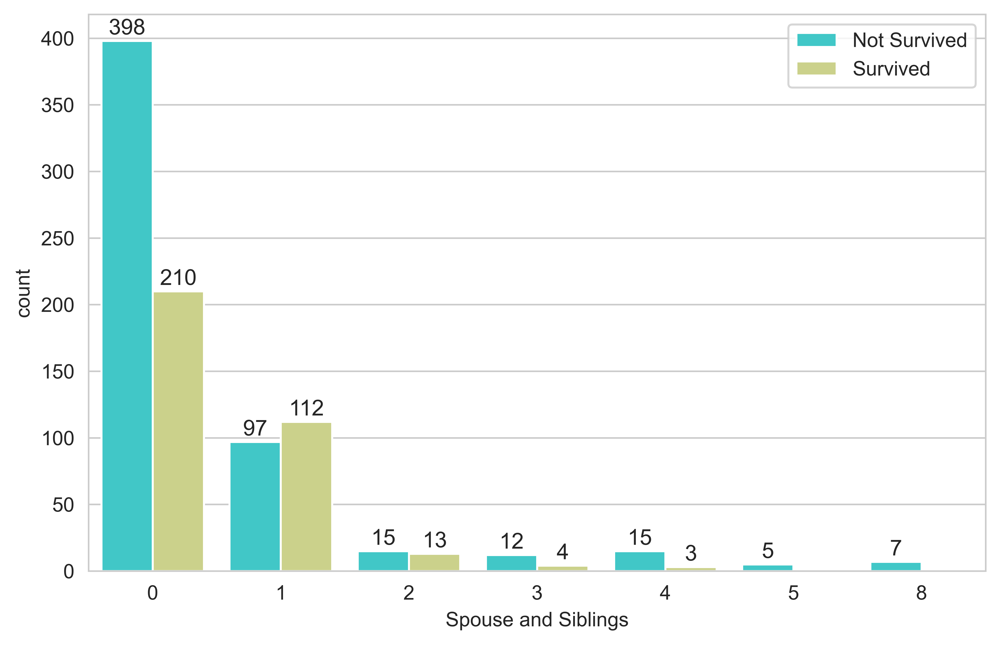

In [44]:
plt.figure(figsize=(8,5))
c1 = sns.countplot(x='SibSp', hue='Survived', data=titanic_train, palette='rainbow')
c1.bar_label(c1.containers[0], padding=1, size=11)
c1.bar_label(c1.containers[1], padding=1, size=11)
plt.legend(labels=['Not Survived', 'Survived'], loc='upper right')
plt.xlabel('Spouse and Siblings')
plt.show()

In [45]:
# Count
sibsp_survival_count = (titanic_train.groupby(['SibSp', 'Survived'])['PassengerId'].count()
                        .unstack(fill_value=0).rename_axis(None, axis=1))
sibsp_survival_count.rename(columns={0: 'Not Survived', 1: 'Survived'}, inplace=True)
sibsp_survival_count['Total'] = sibsp_survival_count.sum(axis=1)
sibsp_survival_count

,Not Survived,Survived,Total
SibSp,,,
0,398,210,608
1,97,112,209
2,15,13,28
3,12,4,16
4,15,3,18
5,5,0,5
8,7,0,7


In [46]:
# Survival Rate
titanic_train[['SibSp', 'Survived']].groupby('SibSp').mean().sort_values(by='Survived', ascending=False)

,Survived
SibSp,
1,0.535885
2,0.464286
0,0.345395
3,0.250000
4,0.166667
5,0.000000
8,0.000000


**Observations:**
- Most of the passengers are not with their Spouse or Siblings and lot of people either have only Spouse or one Sibling with them.
- Passengers whose 'SibSp' count are 1 or 2 had better survival rate than those 'SibSp' count is 0.

### Survival based on 'Parch' (Parent and Childrens)

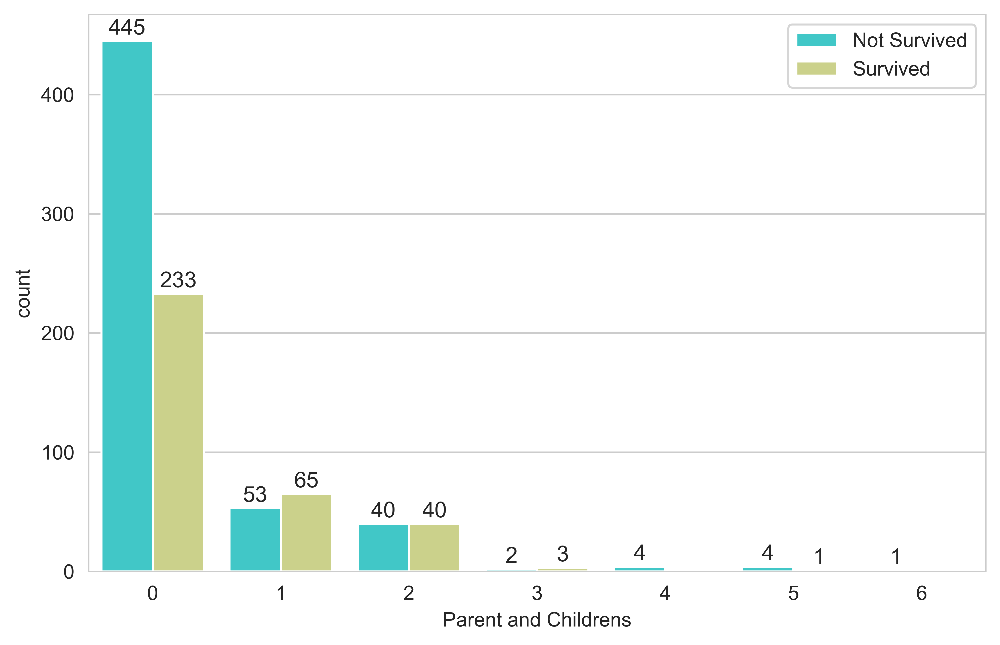

In [47]:
plt.figure(figsize=(8,5))
c1 = sns.countplot(x='Parch', hue='Survived', data=titanic_train, palette='rainbow')
c1.bar_label(c1.containers[0], padding=1, size=11)
c1.bar_label(c1.containers[1], padding=1, size=11)
plt.legend(labels=['Not Survived', 'Survived'], loc='upper right')
plt.xlabel("Parent and Childrens")
plt.show()

In [48]:
# Count
parch_survival_count = (titanic_train.groupby(['Parch', 'Survived'])['PassengerId'].count()
                        .unstack(fill_value=0).rename_axis(None, axis=1))
parch_survival_count.rename(columns={0: 'Not Survived', 1: 'Survived'}, inplace=True)
parch_survival_count['Total'] = parch_survival_count.sum(axis=1)
parch_survival_count

,Not Survived,Survived,Total
Parch,,,
0,445,233,678
1,53,65,118
2,40,40,80
3,2,3,5
4,4,0,4
5,4,1,5
6,1,0,1


In [49]:
# Survival Rate
titanic_train[['Parch', 'Survived']].groupby('Parch').mean().sort_values(by='Survived', ascending=False)

,Survived
Parch,
3,0.600000
1,0.550847
2,0.500000
0,0.343658
5,0.200000
4,0.000000
6,0.000000


**Observations:**
- Again, most of the passengers are not with their Parent and Childrens and lot of people either have only single parent or one child with them.
- Passengers whose 'Parch' count is 3 had best survival rate.
- Passengers whose 'Parch' count are 3,1 or 2 had better survival rate than those 'Parch' count is 0.

### Survival based on Age

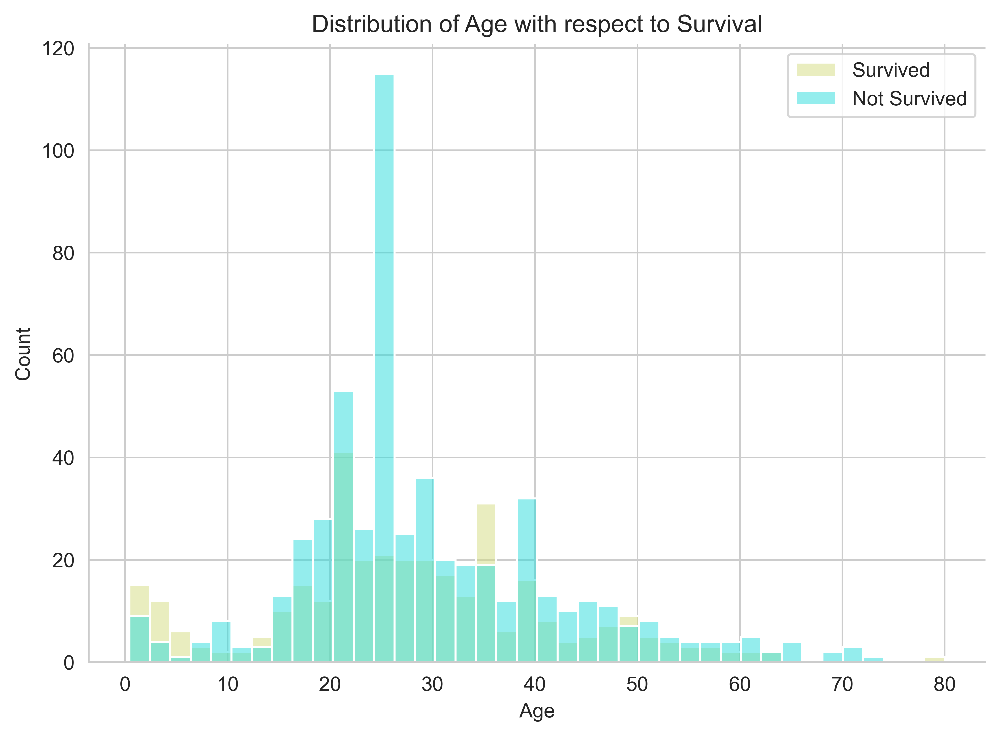

In [50]:
sns.displot(x='Age', data=titanic_train, hue='Survived', bins=40, palette='rainbow', legend=False, aspect=1.4)
plt.title('Distribution of Age with respect to Survival')
plt.legend(labels=['Survived', 'Not Survived'])
plt.show()

**Observations:**
- Infants (Age <=4) had high survival rate.
- Oldest passengers (Age = 80) survived.
- Large number of 15-25 year olds did not survive.
- Most passengers are in 15-35 age range.

###  Fare Distribution

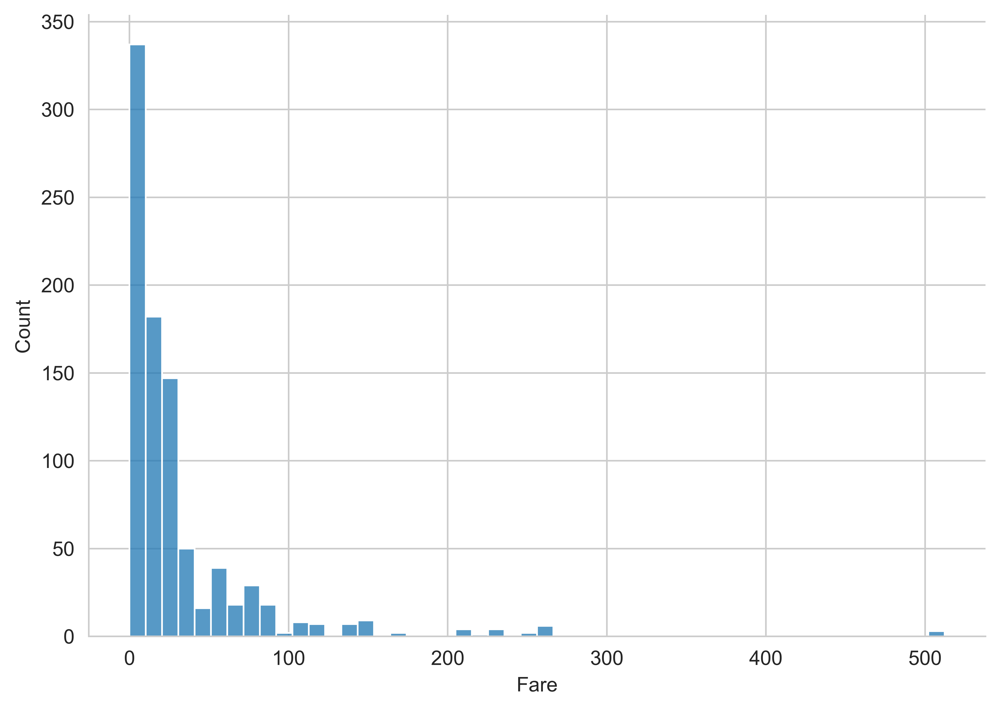

In [51]:
sns.displot(titanic_train['Fare'], bins=50, aspect=1.4)
plt.show()

In [52]:
titanic_train['Fare'].max()

512.3292

**Observation:**
- The mostly Fare is between 0 to 50.

### Fare Distribution between 0 to 50

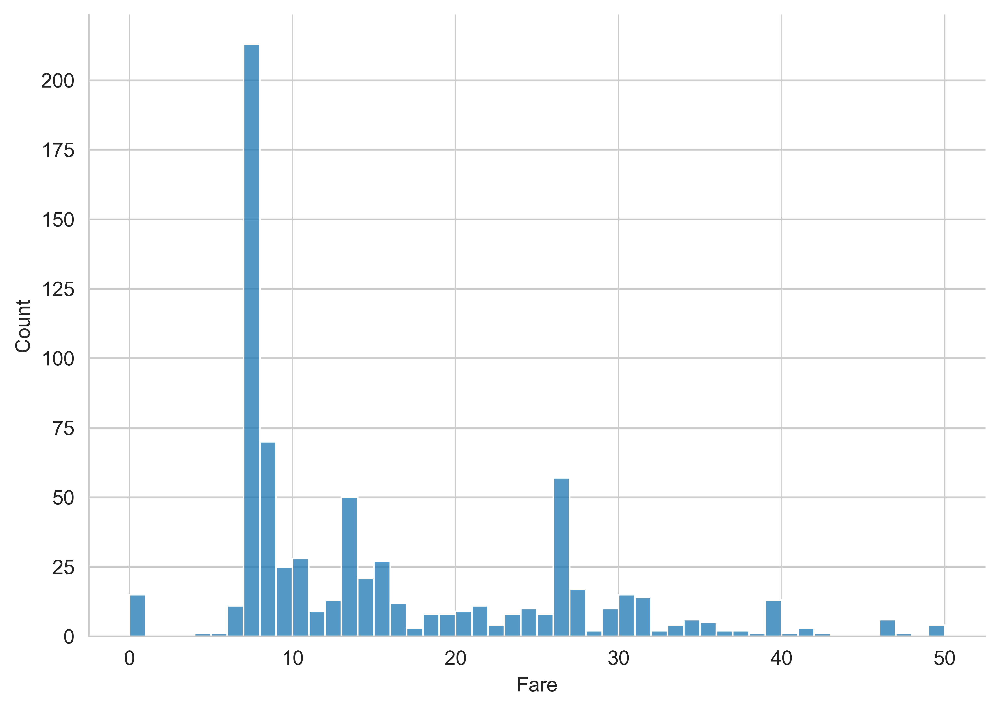

In [53]:
sns.displot(titanic_train[titanic_train['Fare'] <= 50]['Fare'], bins=50, aspect=1.4)
plt.show()

**Observation:**
- Most of times Fare is under 10 dollars. As we know, there are lot of People which belong to Third Class which is cheapest.

# Feature Engineering

In [54]:
titanic_train

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S
...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,21.0,1,2,W./C. 6607,23.4500,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C


**Note:**
- 'Sex' and 'Embarked' are Non-Numerical Categorical Columns and we need to convert them to Numerical Ordinal Features. So, our Machine Learning Model can process them.
- 'PassengerId' and 'Ticket' are non-deterministic columns to predict survival, hence dropping them.

### Dropping 'Ticket'

In [55]:
for dataset in combine:
    dataset.drop('Ticket', axis=1, inplace=True)

### Extracting 'Title' From 'Name'

In [56]:
for dataset in combine:
    dataset['Title'] = dataset['Name'].str.extract(' ([A-Za-z]+)\.', expand=False)
pd.crosstab(index=titanic_train['Title'], columns=titanic_train['Sex']).rename_axis(None, axis=1)

,female,male
Title,,
Capt,0,1
Col,0,2
Countess,1,0
Don,0,1
Dr,1,6
Jonkheer,0,1
Lady,1,0
Major,0,2
Master,0,40


- *Replacing Uncommon Titles with a more common Title or classifying them as Rare*

In [57]:
for dataset in combine:
    dataset['Title'] = dataset['Title'].replace(['Lady', 'Countess','Capt', 'Col', 'Don', 'Dr', 'Major', \
                                                             'Rev', 'Sir', 'Jonkheer', 'Dona'], 'Rare')
    dataset['Title'] = dataset['Title'].replace(['Mlle','Ms'], 'Miss')
    dataset['Title'] = dataset['Title'].replace('Mme', 'Mrs')

# Survival Rate based on Title
titanic_train[['Title','Survived']].groupby('Title').mean().sort_values('Survived', ascending=False)

,Survived
Title,
Mrs,0.793651
Miss,0.702703
Master,0.575000
Rare,0.347826
Mr,0.156673


- *Converting Categorical Titles with Ordinal Values*

In [58]:
title_mapping = {'Mr': 1, 'Miss': 2, 'Mrs': 3, 'Master': 4, 'Rare': 5}
for dataset in combine:
    dataset['Title'] = dataset['Title'].map(title_mapping)
titanic_train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked,Title
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,7.2500,S,1
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,71.2833,C,3
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,7.9250,S,2
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,53.1000,S,3
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,8.0500,S,1


In [59]:
for dataset in combine: 
    dataset.drop('Name', axis=1, inplace=True)
titanic_train.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Title
0,1,0,3,male,22.0,1,0,7.2500,S,1
1,2,1,1,female,38.0,1,0,71.2833,C,3
2,3,1,3,female,26.0,0,0,7.9250,S,2
3,4,1,1,female,35.0,1,0,53.1000,S,3
4,5,0,3,male,35.0,0,0,8.0500,S,1


### Converting 'Age' upto 1 decimal place

In [60]:
for dataset in combine:
    dataset['Age'] = round(dataset['Age'], 1)
titanic_train.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Title
0,1,0,3,male,22.0,1,0,7.2500,S,1
1,2,1,1,female,38.0,1,0,71.2833,C,3
2,3,1,3,female,26.0,0,0,7.9250,S,2
3,4,1,1,female,35.0,1,0,53.1000,S,3
4,5,0,3,male,35.0,0,0,8.0500,S,1


### Creating a New Feature 'IsAlone'

In [61]:
for dataset in combine:
    dataset['IsAlone'] = 0    # Initializing at zero
    dataset.loc[(dataset['SibSp'] == 0) & (dataset['Parch'] == 0), 'IsAlone'] = 1
titanic_train.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Title,IsAlone
0,1,0,3,male,22.0,1,0,7.2500,S,1,0
1,2,1,1,female,38.0,1,0,71.2833,C,3,0
2,3,1,3,female,26.0,0,0,7.9250,S,2,1
3,4,1,1,female,35.0,1,0,53.1000,S,3,0
4,5,0,3,male,35.0,0,0,8.0500,S,1,1


**Survival based on 'IsAlone'**

In [62]:
titanic_train[['IsAlone', 'Survived']].groupby('IsAlone').mean().sort_values('Survived', ascending=False)

,Survived
IsAlone,
0,0.505650
1,0.303538


### Converting 'Fare' upto 2 Decimal place

In [63]:
for dataset in combine:
    dataset['Fare'] = round(dataset['Fare'], 2)
titanic_train.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Title,IsAlone
0,1,0,3,male,22.0,1,0,7.25,S,1,0
1,2,1,1,female,38.0,1,0,71.28,C,3,0
2,3,1,3,female,26.0,0,0,7.92,S,2,1
3,4,1,1,female,35.0,1,0,53.10,S,3,0
4,5,0,3,male,35.0,0,0,8.05,S,1,1


### Converting 'Sex' and 'Embarked' to Discrete Integer Values

In [64]:
# 'Sex'
for dataset in combine:
    dataset['Sex'] = dataset['Sex'].map({'male' : 1, 'female' : 0})
    dataset.rename(columns = {'Sex' : 'Male'}, inplace=True)

    # Conversion from 'object' to 'int64'
    dataset['Male'] = dataset['Male'].astype('int64')
titanic_train.head()

,PassengerId,Survived,Pclass,Male,Age,SibSp,Parch,Fare,Embarked,Title,IsAlone
0,1,0,3,1,22.0,1,0,7.25,S,1,0
1,2,1,1,0,38.0,1,0,71.28,C,3,0
2,3,1,3,0,26.0,0,0,7.92,S,2,1
3,4,1,1,0,35.0,1,0,53.10,S,3,0
4,5,0,3,1,35.0,0,0,8.05,S,1,1


In [65]:
# 'Embarked'
for dataset in combine:
    dataset['Embarked'] = dataset['Embarked'].map({'S': 0, 'C': 1, 'Q': 2})

    # Conversion from 'object' to 'int64'
    dataset['Embarked'] = dataset['Embarked'].astype('int64')
titanic_train.head()

,PassengerId,Survived,Pclass,Male,Age,SibSp,Parch,Fare,Embarked,Title,IsAlone
0,1,0,3,1,22.0,1,0,7.25,0,1,0
1,2,1,1,0,38.0,1,0,71.28,1,3,0
2,3,1,3,0,26.0,0,0,7.92,0,2,1
3,4,1,1,0,35.0,1,0,53.10,0,3,0
4,5,0,3,1,35.0,0,0,8.05,0,1,1


### Dropping 'PassengerId'

In [66]:
titanic_train.drop('PassengerId', axis=1, inplace=True)

# Dataset is ready for Machine Learning Model 👌

In [67]:
# Training Dataset
titanic_train.head()

,Survived,Pclass,Male,Age,SibSp,Parch,Fare,Embarked,Title,IsAlone
0,0,3,1,22.0,1,0,7.25,0,1,0
1,1,1,0,38.0,1,0,71.28,1,3,0
2,1,3,0,26.0,0,0,7.92,0,2,1
3,1,1,0,35.0,1,0,53.10,0,3,0
4,0,3,1,35.0,0,0,8.05,0,1,1


In [68]:
# Null
titanic_train.isnull().sum()

Survived    0
Pclass      0
Male        0
Age         0
SibSp       0
Parch       0
Fare        0
Embarked    0
Title       0
IsAlone     0
dtype: int64

In [69]:
# Testing Dataset
titanic_test.head()

,PassengerId,Pclass,Male,Age,SibSp,Parch,Fare,Embarked,Title,IsAlone
0,892,3,1,34.5,0,0,7.83,2,1,1
1,893,3,0,47.0,1,0,7.00,0,3,0
2,894,2,1,62.0,0,0,9.69,2,1,1
3,895,3,1,27.0,0,0,8.66,0,1,1
4,896,3,0,22.0,1,1,12.29,0,3,0


In [70]:
# Null
titanic_test.isnull().sum()

PassengerId    0
Pclass         0
Male           0
Age            0
SibSp          0
Parch          0
Fare           0
Embarked       0
Title          0
IsAlone        0
dtype: int64

# Machine Learning

### Feature Correlation

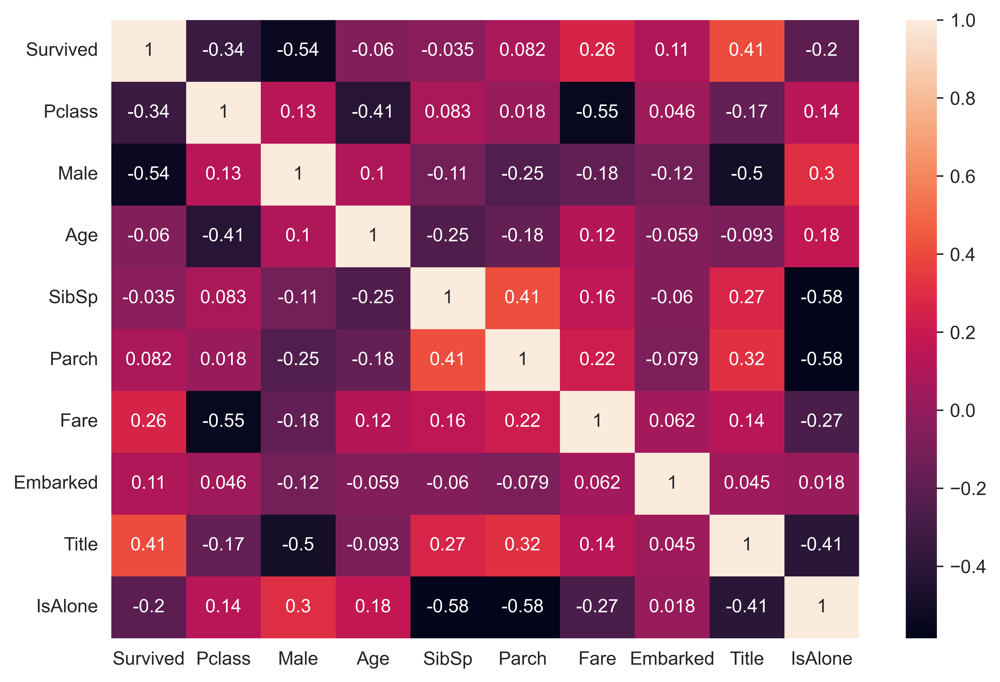

In [71]:
plt.figure(figsize=(9,6))
sns.heatmap(titanic_train.corr(), annot=True)
plt.show()

In [72]:
# Machine Learning Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

# Evaluation
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import cross_val_score

In [73]:
# Manually Testing of Machine Learning Models
log_model = LogisticRegression(max_iter=500)
log_model.fit(titanic_train.drop('Survived', axis=1), titanic_train['Survived'])
log_accuracy = round((cross_val_score(log_model, titanic_train.drop('Survived', axis=1), 
                titanic_train['Survived'], cv=5, n_jobs=-1).mean()) * 100, 3)

random_forest_model = RandomForestClassifier(n_estimators=500)
random_forest_model.fit(titanic_train.drop('Survived', axis=1), titanic_train['Survived'])
random_forest_accuracy = round((cross_val_score(random_forest_model, titanic_train.drop('Survived', axis=1), 
                titanic_train['Survived'], cv=5, n_jobs=-1).mean()) * 100, 3)

svc_model = SVC(gamma='auto')
svc_model.fit(titanic_train.drop('Survived', axis=1), titanic_train['Survived'])
svc_accuracy = round((cross_val_score(svc_model, titanic_train.drop('Survived', axis=1), 
                titanic_train['Survived'], cv=5, n_jobs=-1).mean()) * 100, 3)

print("\033[1mUnopitmized Models Accuracy\033[0m")
pd.DataFrame(data={'Score' : [log_accuracy, random_forest_accuracy, svc_accuracy]}, columns=['Score'],
            index=[str(log_model), str(random_forest_model), str(svc_model)])

Unopitmized Models Accuracy


,Score
LogisticRegression(max_iter=500),81.594
RandomForestClassifier(n_estimators=500),80.471
SVC(gamma='auto'),71.831


### Coefficient Interpretation

In [74]:
corr_survival = pd.DataFrame(titanic_train.columns.delete([0]))
corr_survival.columns = ['Features']
corr_survival['Survived'] = (log_model.coef_[0])
corr_survival

,Features,Survived
0,Pclass,-1.041667
1,Male,-2.145201
2,Age,-0.041586
3,SibSp,-0.554968
4,Parch,-0.297286
5,Fare,0.003208
6,Embarked,0.167654
7,Title,0.468701
8,IsAlone,-0.511572


### Model Optimization

In [75]:
import optuna
def log_objective(trial):
    log_grid = {
        'C' : trial.suggest_float('C',  1e-4, 1e4, log=True),
        'solver' : trial.suggest_categorical('solver', ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']),
        'max_iter' : trial.suggest_int('max_iter', 100, 1000, 100),
        'class_weight' : trial.suggest_categorical('class_weight', [None, 'balanced'])
    }

    clf = LogisticRegression(**log_grid)

    return cross_val_score(clf,titanic_train.drop('Survived', axis=1),titanic_train['Survived'],n_jobs=-1,cv=5).mean()
    
def random_forest_objective(trial):
    random_forest_grid = {
        'n_estimators' : trial.suggest_int('n_estimators', 100, 1000, 100),
        'criterion' : trial.suggest_categorical('criterion', ['gini', 'entropy']),
        'max_depth' : trial.suggest_int('max_depth', 10, 50, 5),
        'min_samples_split' : trial.suggest_int('min_samples_split', 2, 10),
        'max_features' : trial.suggest_categorical('max_features', ['auto', 'sqrt', 'log2'])      
    }

    clf = RandomForestClassifier(**random_forest_grid)

    return cross_val_score(clf,titanic_train.drop('Survived', axis=1),titanic_train['Survived'],n_jobs=-1,cv=5).mean()

def svc_objective(trial):
    svc_grid = {
        'C' : trial.suggest_float('C', 1e-3, 1e3, log=True),
        'gamma' : trial.suggest_categorical('gamma', ['scale', 'auto']),
        'class_weight' : trial.suggest_categorical('class_weight', [None, 'balanced'])
    }
    
    clf = SVC(**svc_grid)
    
    return cross_val_score(clf,titanic_train.drop('Survived', axis=1),titanic_train['Survived'], n_jobs=-1, cv=5).mean()

In [76]:
study_log = optuna.create_study(direction='maximize')
study_log.optimize(log_objective, n_trials=200)

[I 2023-05-25 01:40:12,226] A new study created in memory with name: no-name-eb933cd3-519a-4c48-9fa6-242995d8a5bb
[I 2023-05-25 01:40:12,956] Trial 0 finished with value: 0.8136965664427844 and parameters: {'C': 34.06459693609168, 'solver': 'lbfgs', 'max_iter': 100, 'class_weight': None}. Best is trial 0 with value: 0.8136965664427844.
[I 2023-05-25 01:40:13,010] Trial 1 finished with value: 0.8136965664427844 and parameters: {'C': 16.581265840963184, 'solver': 'lbfgs', 'max_iter': 700, 'class_weight': None}. Best is trial 0 with value: 0.8136965664427844.
[I 2023-05-25 01:40:13,066] Trial 2 finished with value: 0.7329797250643398 and parameters: {'C': 3.685098920521607, 'solver': 'saga', 'max_iter': 400, 'class_weight': None}. Best is trial 0 with value: 0.8136965664427844.
[I 2023-05-25 01:40:13,114] Trial 3 finished with value: 0.8181783943255289 and parameters: {'C': 0.42439899457994634, 'solver': 'lbfgs', 'max_iter': 600, 'class_weight': None}. Best is trial 3 with value: 0.818178

[I 2023-05-25 01:40:14,675] Trial 34 finished with value: 0.7329797250643398 and parameters: {'C': 3.554520223635399, 'solver': 'saga', 'max_iter': 400, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:14,732] Trial 35 finished with value: 0.8181783943255289 and parameters: {'C': 0.4691696150352085, 'solver': 'lbfgs', 'max_iter': 200, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:14,788] Trial 36 finished with value: 0.8136965664427844 and parameters: {'C': 8.230216379083922, 'solver': 'lbfgs', 'max_iter': 200, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:14,828] Trial 37 finished with value: 0.7957504237022157 and parameters: {'C': 1.8358364450050793, 'solver': 'lbfgs', 'max_iter': 100, 'class_weight': 'balanced'}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:14,926] Trial 38 finished with value: 0.7857008348502919 and parameters: 

[I 2023-05-25 01:40:16,554] Trial 69 finished with value: 0.8080785889146946 and parameters: {'C': 0.1572823503107504, 'solver': 'lbfgs', 'max_iter': 700, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:16,601] Trial 70 finished with value: 0.8013684012303057 and parameters: {'C': 0.27177564261157644, 'solver': 'lbfgs', 'max_iter': 100, 'class_weight': 'balanced'}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:16,649] Trial 71 finished with value: 0.8159437574540205 and parameters: {'C': 0.7007085707265138, 'solver': 'lbfgs', 'max_iter': 400, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:16,727] Trial 72 finished with value: 0.8170547988199109 and parameters: {'C': 0.42416627571021615, 'solver': 'lbfgs', 'max_iter': 300, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:16,790] Trial 73 finished with value: 0.8159437574540205 and paramet

[I 2023-05-25 01:40:18,500] Trial 104 finished with value: 0.8114430983616847 and parameters: {'C': 0.21970873463278132, 'solver': 'lbfgs', 'max_iter': 500, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:18,563] Trial 105 finished with value: 0.8170610758897746 and parameters: {'C': 0.5230697682987286, 'solver': 'lbfgs', 'max_iter': 500, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:18,595] Trial 106 finished with value: 0.8069612704789405 and parameters: {'C': 0.7867784962004832, 'solver': 'liblinear', 'max_iter': 600, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:18,661] Trial 107 finished with value: 0.7744962651434311 and parameters: {'C': 1.4859335871744388, 'solver': 'sag', 'max_iter': 500, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:18,740] Trial 108 finished with value: 0.8181783943255289 and paramet

[I 2023-05-25 01:40:20,705] Trial 139 finished with value: 0.8013684012303056 and parameters: {'C': 1.8516002158904372, 'solver': 'lbfgs', 'max_iter': 500, 'class_weight': 'balanced'}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:20,771] Trial 140 finished with value: 0.8159437574540205 and parameters: {'C': 0.6336619641707955, 'solver': 'lbfgs', 'max_iter': 700, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:20,835] Trial 141 finished with value: 0.8181783943255289 and parameters: {'C': 0.43179372734843424, 'solver': 'lbfgs', 'max_iter': 800, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:20,897] Trial 142 finished with value: 0.8159374803841567 and parameters: {'C': 0.333578291303788, 'solver': 'lbfgs', 'max_iter': 800, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:20,941] Trial 143 finished with value: 0.8181783943255289 and para

[I 2023-05-25 01:40:22,826] Trial 174 finished with value: 0.8181783943255289 and parameters: {'C': 0.4256270477661879, 'solver': 'lbfgs', 'max_iter': 800, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:22,890] Trial 175 finished with value: 0.8159437574540205 and parameters: {'C': 0.8876877197616351, 'solver': 'lbfgs', 'max_iter': 800, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:22,937] Trial 176 finished with value: 0.8114430983616847 and parameters: {'C': 0.21671673884036366, 'solver': 'lbfgs', 'max_iter': 800, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:23,006] Trial 177 finished with value: 0.8159437574540205 and parameters: {'C': 1.3738385766434638, 'solver': 'lbfgs', 'max_iter': 600, 'class_weight': None}. Best is trial 3 with value: 0.8181783943255289.
[I 2023-05-25 01:40:23,074] Trial 178 finished with value: 0.8159437574540205 and parameter

In [77]:
study_random_forest = optuna.create_study(direction='maximize')
study_random_forest.optimize(random_forest_objective, n_trials=200)

[I 2023-05-25 01:40:24,321] A new study created in memory with name: no-name-d7939da1-47a2-47dc-9ecc-33f6399cd3b5
[I 2023-05-25 01:40:25,057] Trial 0 finished with value: 0.8327851358985626 and parameters: {'n_estimators': 500, 'criterion': 'gini', 'max_depth': 40, 'min_samples_split': 9, 'max_features': 'log2'}. Best is trial 0 with value: 0.8327851358985626.
[I 2023-05-25 01:40:26,659] Trial 1 finished with value: 0.8024731655263324 and parameters: {'n_estimators': 1000, 'criterion': 'entropy', 'max_depth': 35, 'min_samples_split': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8327851358985626.
[I 2023-05-25 01:40:27,473] Trial 2 finished with value: 0.8361621994852803 and parameters: {'n_estimators': 600, 'criterion': 'gini', 'max_depth': 10, 'min_samples_split': 7, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8361621994852803.
[I 2023-05-25 01:40:29,051] Trial 3 finished with value: 0.8249074132195091 and parameters: {'n_estimators': 1000, 'criterion': 'entrop

[I 2023-05-25 01:40:50,143] Trial 31 finished with value: 0.8339087314041805 and parameters: {'n_estimators': 600, 'criterion': 'gini', 'max_depth': 20, 'min_samples_split': 9, 'max_features': 'sqrt'}. Best is trial 24 with value: 0.837266963781307.
[I 2023-05-25 01:40:50,849] Trial 32 finished with value: 0.8395204318624068 and parameters: {'n_estimators': 600, 'criterion': 'gini', 'max_depth': 25, 'min_samples_split': 9, 'max_features': 'sqrt'}. Best is trial 32 with value: 0.8395204318624068.
[I 2023-05-25 01:40:51,498] Trial 33 finished with value: 0.8361621994852803 and parameters: {'n_estimators': 500, 'criterion': 'gini', 'max_depth': 10, 'min_samples_split': 9, 'max_features': 'sqrt'}. Best is trial 32 with value: 0.8395204318624068.
[I 2023-05-25 01:40:52,125] Trial 34 finished with value: 0.8327914129684263 and parameters: {'n_estimators': 500, 'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 32 with value: 0.83952043186

[I 2023-05-25 01:41:15,122] Trial 62 finished with value: 0.837266963781307 and parameters: {'n_estimators': 400, 'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 9, 'max_features': 'sqrt'}. Best is trial 32 with value: 0.8395204318624068.
[I 2023-05-25 01:41:15,850] Trial 63 finished with value: 0.8294206264515724 and parameters: {'n_estimators': 500, 'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 32 with value: 0.8395204318624068.
[I 2023-05-25 01:41:16,295] Trial 64 finished with value: 0.8361559224154165 and parameters: {'n_estimators': 300, 'criterion': 'gini', 'max_depth': 45, 'min_samples_split': 9, 'max_features': 'sqrt'}. Best is trial 32 with value: 0.8395204318624068.
[I 2023-05-25 01:41:16,867] Trial 65 finished with value: 0.8350323269097986 and parameters: {'n_estimators': 400, 'criterion': 'gini', 'max_depth': 40, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 32 with value: 0.8395204318624

[I 2023-05-25 01:41:36,358] Trial 93 finished with value: 0.8372857949908983 and parameters: {'n_estimators': 600, 'criterion': 'entropy', 'max_depth': 50, 'min_samples_split': 8, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:41:37,297] Trial 94 finished with value: 0.8361433682756889 and parameters: {'n_estimators': 600, 'criterion': 'entropy', 'max_depth': 45, 'min_samples_split': 8, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:41:38,140] Trial 95 finished with value: 0.8372732408511707 and parameters: {'n_estimators': 600, 'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:41:39,220] Trial 96 finished with value: 0.8327851358985626 and parameters: {'n_estimators': 700, 'criterion': 'entropy', 'max_depth': 20, 'min_samples_split': 8, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417

[I 2023-05-25 01:42:03,356] Trial 124 finished with value: 0.8350323269097986 and parameters: {'n_estimators': 600, 'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:42:04,093] Trial 125 finished with value: 0.8361496453455528 and parameters: {'n_estimators': 500, 'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 7, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:42:04,973] Trial 126 finished with value: 0.8361559224154165 and parameters: {'n_estimators': 600, 'criterion': 'gini', 'max_depth': 30, 'min_samples_split': 9, 'max_features': 'auto'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:42:05,559] Trial 127 finished with value: 0.830525390747599 and parameters: {'n_estimators': 400, 'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.841773899

[I 2023-05-25 01:42:29,329] Trial 155 finished with value: 0.8327914129684265 and parameters: {'n_estimators': 600, 'criterion': 'gini', 'max_depth': 40, 'min_samples_split': 7, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:42:30,202] Trial 156 finished with value: 0.8361559224154165 and parameters: {'n_estimators': 600, 'criterion': 'gini', 'max_depth': 40, 'min_samples_split': 8, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:42:31,052] Trial 157 finished with value: 0.8361496453455528 and parameters: {'n_estimators': 600, 'criterion': 'gini', 'max_depth': 35, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:42:31,976] Trial 158 finished with value: 0.8305379448873266 and parameters: {'n_estimators': 600, 'criterion': 'entropy', 'max_depth': 40, 'min_samples_split': 8, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.841773

[I 2023-05-25 01:42:54,955] Trial 186 finished with value: 0.8372795179210346 and parameters: {'n_estimators': 500, 'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:42:55,968] Trial 187 finished with value: 0.8327976900382902 and parameters: {'n_estimators': 700, 'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:42:56,928] Trial 188 finished with value: 0.8350386039796623 and parameters: {'n_estimators': 600, 'criterion': 'gini', 'max_depth': 25, 'min_samples_split': 10, 'max_features': 'sqrt'}. Best is trial 79 with value: 0.8417738999435065.
[I 2023-05-25 01:42:57,681] Trial 189 finished with value: 0.8327851358985626 and parameters: {'n_estimators': 500, 'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 10, 'max_features': 'log2'}. Best is trial 79 with value: 0.841773

In [78]:
study_svc = optuna.create_study(direction='maximize')
study_svc.optimize(svc_objective, n_trials=200)

[I 2023-05-25 01:43:04,903] A new study created in memory with name: no-name-f5947d0a-fc24-4227-bcea-055fd909d082
[I 2023-05-25 01:43:04,951] Trial 0 finished with value: 0.7800577490427469 and parameters: {'C': 183.149023953266, 'gamma': 'scale', 'class_weight': 'balanced'}. Best is trial 0 with value: 0.7800577490427469.
[I 2023-05-25 01:43:04,999] Trial 1 finished with value: 0.7700018831209592 and parameters: {'C': 12.306849662328048, 'gamma': 'scale', 'class_weight': 'balanced'}. Best is trial 0 with value: 0.7800577490427469.
[I 2023-05-25 01:43:05,043] Trial 2 finished with value: 0.7105643085807546 and parameters: {'C': 4.604412592784203, 'gamma': 'scale', 'class_weight': None}. Best is trial 0 with value: 0.7800577490427469.
[I 2023-05-25 01:43:05,086] Trial 3 finished with value: 0.7004645031699204 and parameters: {'C': 3.1883412256502557, 'gamma': 'scale', 'class_weight': None}. Best is trial 0 with value: 0.7800577490427469.
[I 2023-05-25 01:43:05,157] Trial 4 finished with

[I 2023-05-25 01:43:07,540] Trial 36 finished with value: 0.7285041742514594 and parameters: {'C': 9.78883312612172, 'gamma': 'scale', 'class_weight': None}. Best is trial 35 with value: 0.7968614650681063.
[I 2023-05-25 01:43:07,605] Trial 37 finished with value: 0.7026300922729269 and parameters: {'C': 34.59927109723762, 'gamma': 'auto', 'class_weight': None}. Best is trial 35 with value: 0.7968614650681063.
[I 2023-05-25 01:43:07,686] Trial 38 finished with value: 0.8013432929508506 and parameters: {'C': 380.4747810276991, 'gamma': 'scale', 'class_weight': None}. Best is trial 38 with value: 0.8013432929508506.
[I 2023-05-25 01:43:07,797] Trial 39 finished with value: 0.7071056430858075 and parameters: {'C': 329.5464761910901, 'gamma': 'auto', 'class_weight': None}. Best is trial 38 with value: 0.8013432929508506.
[I 2023-05-25 01:43:07,852] Trial 40 finished with value: 0.795744146632352 and parameters: {'C': 163.76551773080524, 'gamma': 'scale', 'class_weight': None}. Best is tria

[I 2023-05-25 01:43:11,121] Trial 74 finished with value: 0.8013432929508506 and parameters: {'C': 785.4187243825604, 'gamma': 'scale', 'class_weight': None}. Best is trial 66 with value: 0.803577929822359.
[I 2023-05-25 01:43:11,213] Trial 75 finished with value: 0.7968551879982424 and parameters: {'C': 267.6412271119556, 'gamma': 'scale', 'class_weight': None}. Best is trial 66 with value: 0.803577929822359.
[I 2023-05-25 01:43:11,279] Trial 76 finished with value: 0.795744146632352 and parameters: {'C': 162.65757258570704, 'gamma': 'scale', 'class_weight': None}. Best is trial 66 with value: 0.803577929822359.
[I 2023-05-25 01:43:11,426] Trial 77 finished with value: 0.8024668884564686 and parameters: {'C': 718.2070000079462, 'gamma': 'scale', 'class_weight': None}. Best is trial 66 with value: 0.803577929822359.
[I 2023-05-25 01:43:11,547] Trial 78 finished with value: 0.8024668884564686 and parameters: {'C': 712.8239385468092, 'gamma': 'scale', 'class_weight': None}. Best is trial

[I 2023-05-25 01:43:15,298] Trial 112 finished with value: 0.8024668884564686 and parameters: {'C': 697.3028299565826, 'gamma': 'scale', 'class_weight': None}. Best is trial 66 with value: 0.803577929822359.
[I 2023-05-25 01:43:15,457] Trial 113 finished with value: 0.803577929822359 and parameters: {'C': 998.1015982245201, 'gamma': 'scale', 'class_weight': None}. Best is trial 66 with value: 0.803577929822359.
[I 2023-05-25 01:43:15,612] Trial 114 finished with value: 0.803577929822359 and parameters: {'C': 979.483894868809, 'gamma': 'scale', 'class_weight': None}. Best is trial 66 with value: 0.803577929822359.
[I 2023-05-25 01:43:15,768] Trial 115 finished with value: 0.803577929822359 and parameters: {'C': 993.6198628808257, 'gamma': 'scale', 'class_weight': None}. Best is trial 66 with value: 0.803577929822359.
[I 2023-05-25 01:43:15,877] Trial 116 finished with value: 0.803577929822359 and parameters: {'C': 990.6066185559351, 'gamma': 'scale', 'class_weight': None}. Best is trial

[I 2023-05-25 01:43:19,754] Trial 150 finished with value: 0.8024668884564686 and parameters: {'C': 717.5190816893196, 'gamma': 'scale', 'class_weight': None}. Best is trial 143 with value: 0.8035842068922227.
[I 2023-05-25 01:43:19,894] Trial 151 finished with value: 0.8013432929508506 and parameters: {'C': 799.6260437055629, 'gamma': 'scale', 'class_weight': None}. Best is trial 143 with value: 0.8035842068922227.
[I 2023-05-25 01:43:20,030] Trial 152 finished with value: 0.8013432929508506 and parameters: {'C': 596.1511674573335, 'gamma': 'scale', 'class_weight': None}. Best is trial 143 with value: 0.8035842068922227.
[I 2023-05-25 01:43:20,179] Trial 153 finished with value: 0.8013432929508506 and parameters: {'C': 782.5449491250292, 'gamma': 'scale', 'class_weight': None}. Best is trial 143 with value: 0.8035842068922227.
[I 2023-05-25 01:43:20,227] Trial 154 finished with value: 0.7756261377189129 and parameters: {'C': 18.828171222239774, 'gamma': 'scale', 'class_weight': None}.

[I 2023-05-25 01:43:23,981] Trial 187 finished with value: 0.6981231561107275 and parameters: {'C': 578.1278537822021, 'gamma': 'auto', 'class_weight': None}. Best is trial 143 with value: 0.8035842068922227.
[I 2023-05-25 01:43:24,129] Trial 188 finished with value: 0.7867742137969996 and parameters: {'C': 763.042480422699, 'gamma': 'scale', 'class_weight': 'balanced'}. Best is trial 143 with value: 0.8035842068922227.
[I 2023-05-25 01:43:24,216] Trial 189 finished with value: 0.8024668884564685 and parameters: {'C': 405.8163799143158, 'gamma': 'scale', 'class_weight': None}. Best is trial 143 with value: 0.8035842068922227.
[I 2023-05-25 01:43:24,361] Trial 190 finished with value: 0.8024668884564686 and parameters: {'C': 761.2232339379921, 'gamma': 'scale', 'class_weight': None}. Best is trial 143 with value: 0.8035842068922227.
[I 2023-05-25 01:43:24,545] Trial 191 finished with value: 0.803577929822359 and parameters: {'C': 997.4595967769776, 'gamma': 'scale', 'class_weight': None

### Best Parameters for every Model

In [79]:
print('Logistic Regresssion: ')
print(str(study_log.best_params) + ' || Score: ' + str(round((study_log.best_value * 100), 3)))
print('\n')
print('Random Forest Classifier: ')
print(str(study_random_forest.best_params) + ' || Score: ' + str(round((study_random_forest.best_value * 100), 3)))
print('\n')
print('Support Vector Classifier: ')
print(str(study_svc.best_params) + ' || Score: ' + str(round((study_svc.best_value * 100), 3)))

Logistic Regresssion: 
{'C': 0.42439899457994634, 'solver': 'lbfgs', 'max_iter': 600, 'class_weight': None} || Score: 81.818


Random Forest Classifier: 
{'n_estimators': 400, 'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 10, 'max_features': 'sqrt'} || Score: 84.177


Support Vector Classifier: 
{'C': 567.5422777086873, 'gamma': 'scale', 'class_weight': None} || Score: 80.358


### Model Analysis

In [80]:
models_data = {
    'Model' : ['Logistic Regression', 'Logistic Regression',
               'Random Forest Classifier', 'Random Forest Classifier',
               'Support Vector Classifier', 'Support Vector Classifier'],
    'Tuned' : ['No', 'Yes', 'No', 'Yes', 'No', 'Yes'],
    'Score' : [log_accuracy, round((study_log.best_value * 100), 3),
               random_forest_accuracy, round((study_random_forest.best_value * 100), 3),
               svc_accuracy, round((study_svc.best_value * 100), 3)]
    }
models = pd.DataFrame(columns=['Model', 'Tuned', 'Score'], data=models_data)
models.pivot_table(index=['Model','Tuned'],values='Score')

Score
Model                     Tuned        
Logistic Regression       No     81.594
                          Yes    81.818
Random Forest Classifier  No     80.471
                          Yes    84.177
Support Vector Classifier No     71.831
                          Yes    80.358

In [81]:
# Finest Model
models[models['Score'] == max(models['Score'])]

,Model,Tuned,Score
3,Random Forest Classifier,Yes,84.177


In [82]:
# Finest Model Visualization
optuna.visualization.plot_slice(study_random_forest)

In [83]:
# Finest Model Visualization
optuna.visualization.plot_optimization_history(study_random_forest)

# Final Model

In [84]:
final_model = RandomForestClassifier(**study_random_forest.best_params)
final_model.fit(titanic_train.drop('Survived', axis=1), titanic_train['Survived'])
predictions = final_model.predict(titanic_test.drop('PassengerId', axis=1))
accuracy = round((cross_val_score(final_model, titanic_train.drop('Survived', axis=1), 
                titanic_train['Survived'], cv=5, n_jobs=-1).mean()) * 100, 3)
print("\033[1mAccuracy Score:\033[0m " + str(accuracy))

Accuracy Score: 83.504


## Submission

In [85]:
submission = pd.DataFrame({
        "PassengerId": titanic_test["PassengerId"],
        "Survived": predictions
    })
submission.to_csv('titanic_submission.csv', index=False)

---

<h2 style="text-align:center;"> Thanks for reading the Notebook! If you like the work then Upvote. </h2>